# Parking Space YOLO-NAS Train and  Predict CV Use case 


In [4]:
%%capture
!pip install super-gradients
!pip install --upgrade pillow
!pip install --upgrade torchvision
!pip install torch

In [ ]:
!pip install torch torchvision
import os
import random
import torch
import requests
from PIL import Image

from super_gradients.training import Trainer, dataloaders, models
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050

from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train, 
    coco_detection_yolo_format_val
)

from super_gradients.training.models.detection_models.pp_yolo_e import (
    PPYoloEPostPredictionCallback
)

In [3]:
class config:
    #trainer params
    CHECKPOINT_DIR = 'checkpoints' #specify the path you want to save checkpoints to
    EXPERIMENT_NAME = 'race_number' #specify the experiment name
    #dataset params
    DATA_DIR = '/kaggle/input/parking-space-get-annotation-info-from-xml/datasets' #parent directory to where data lives
    TRAIN_IMAGES_DIR = 'train/images' #child dir of DATA_DIR where train images are
    TRAIN_LABELS_DIR = 'train/labels' #child dir of DATA_DIR where train labels are
    VAL_IMAGES_DIR = 'valid/images' #child dir of DATA_DIR where validation images are
    VAL_LABELS_DIR = 'valid/labels' #child dir of DATA_DIR where validation labels are
    # if you have a test set
    TEST_IMAGES_DIR = 'test/images' #child dir of DATA_DIR where test images are
    TEST_LABELS_DIR = 'test/labels' #child dir of DATA_DIR where test labels are

    CLASSES = ['free_parking_space','not_free_parking_space','partially_free_parking_space']
    NUM_CLASSES = len(CLASSES)

    #dataloader params - you can add whatever PyTorch dataloader params you have
    #could be different across train, val, and test
    DATALOADER_PARAMS={
    'batch_size': 4,
    'num_workers': 2
    }

    # model params
    MODEL_NAME = 'yolo_nas_l' # choose from yolo_nas_s, yolo_nas_m, yolo_nas_l
    PRETRAINED_WEIGHTS = 'coco' #only one option here: coco

In [4]:
trainer = Trainer(experiment_name=config.EXPERIMENT_NAME, 
                  ckpt_root_dir=config.CHECKPOINT_DIR)

In [ ]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': config.DATA_DIR,
        'images_dir': config.TRAIN_IMAGES_DIR,
        'labels_dir': config.TRAIN_LABELS_DIR,
        'classes': config.CLASSES
    },
    dataloader_params=config.DATALOADER_PARAMS
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': config.DATA_DIR,
        'images_dir': config.VAL_IMAGES_DIR,
        'labels_dir': config.VAL_LABELS_DIR,
        'classes': config.CLASSES
    },
    dataloader_params=config.DATALOADER_PARAMS
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': config.DATA_DIR,
        'images_dir': config.TEST_IMAGES_DIR,
        'labels_dir': config.TEST_LABELS_DIR,
        'classes': config.CLASSES
    },
    dataloader_params=config.DATALOADER_PARAMS
)

# See train data

Indexing dataset annotations: 100%|██████████| 6/6 [00:00<00:00, 128.95it/s]


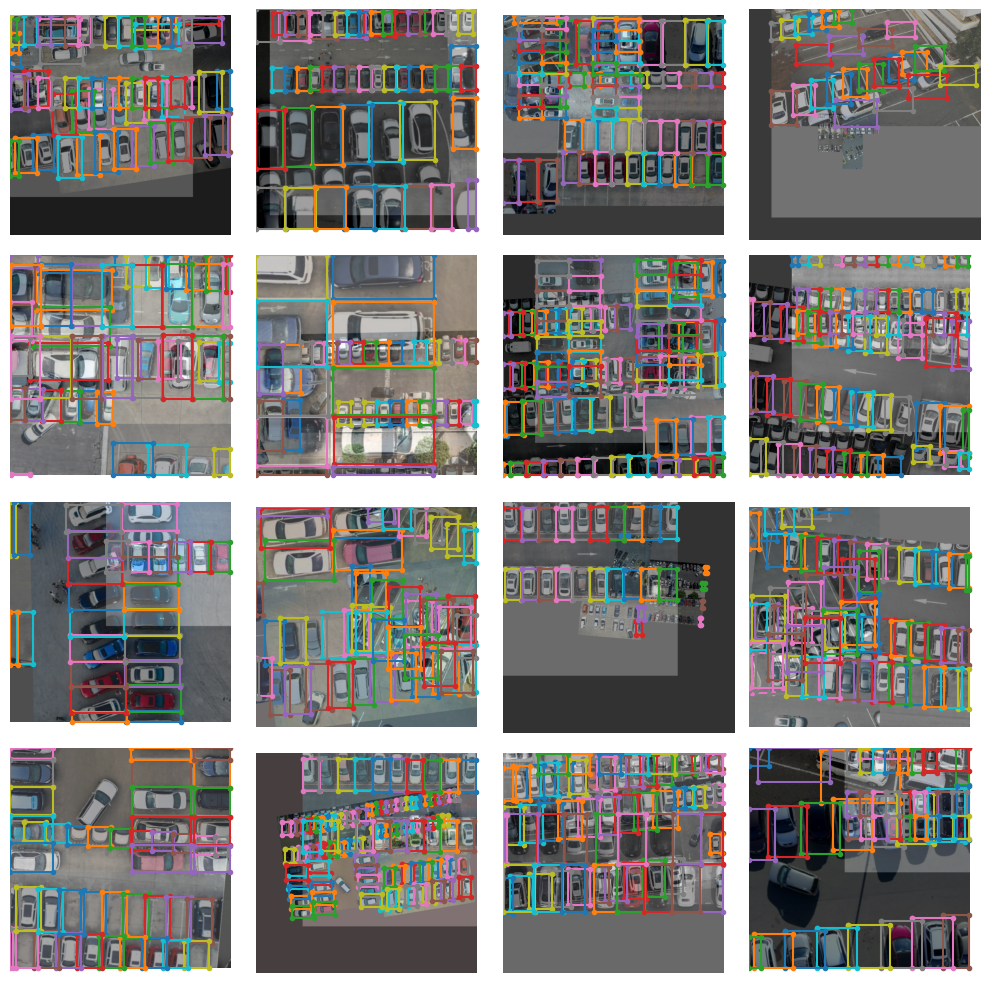

In [6]:
train_data.dataset.plot()

# Model

In [ ]:
model = models.get(config.MODEL_NAME, 
                   num_classes=config.NUM_CLASSES, 
                   pretrained_weights=config.PRETRAINED_WEIGHTS
                   )

In [8]:
train_params = {
    # ENABLING SILENT MODE
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "AdamW",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    # ONLY TRAINING FOR 10 EPOCHS FOR THIS EXAMPLE NOTEBOOK
    "max_epochs": 30,
    "mixed_precision": True, #mixed precision is not available for CPU 
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=config.NUM_CLASSES,
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=config.NUM_CLASSES,
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

# Train the model

In [9]:
trainer.train(model=model, 
              training_params=train_params, 
              train_loader=train_data, 
              valid_loader=val_data)

The console stream is now moved to checkpoints/race_number/console_Sep11_08_14_09.txt


[2023-09-11 08:14:21] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2023-09-11 08:14:23] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Dataset size:                 16         (len(train_set))
    - Batch size per GPU:           4          (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             4          (num_gpus * batch_size)
    - Effective Batch size:         4          (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         4          (len(train_loader))
    - Gradient updates per epoch:   4          (len(train_loader) / batch_accumulate)

[2023-09-11 08:14:23] INFO - sg_trainer.py - Started training for 30 epochs (0/29)

Validating: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s]
[2023-09-11 08:14:39] INFO - base_sg_logger.py - 

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.0545
│   ├── Ppyoloeloss/loss_iou = 0.3418
│   ├── Ppyoloeloss/loss_dfl = 1.485
│   └── Ppyoloeloss/loss = 3.6516
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.974
    ├── Ppyoloeloss/loss_iou = 0.3451
    ├── Ppyoloeloss/loss_dfl = 1.5848
    ├── Ppyoloeloss/loss = 3.6292
    ├── Precision@0.50 = 0.0
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.0039
    └── F1@0.50 = 0.0



Validating epoch 1: 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]
[2023-09-11 08:14:53] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:14:53] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.11372780799865723


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.0055
│   │   ├── Epoch N-1      = 2.0545 (↘ -0.049)
│   │   └── Best until now = 2.0545 (↘ -0.049)
│   ├── Ppyoloeloss/loss_iou = 0.2801
│   │   ├── Epoch N-1      = 0.3418 (↘ -0.0618)
│   │   └── Best until now = 0.3418 (↘ -0.0618)
│   ├── Ppyoloeloss/loss_dfl = 1.2973
│   │   ├── Epoch N-1      = 1.485  (↘ -0.1877)
│   │   └── Best until now = 1.485  (↘ -0.1877)
│   └── Ppyoloeloss/loss = 3.3543
│       ├── Epoch N-1      = 3.6516 (↘ -0.2973)
│       └── Best until now = 3.6516 (↘ -0.2973)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.6595
    │   ├── Epoch N-1      = 1.974  (↘ -0.3146)
    │   └── Best until now = 1.974  (↘ -0.3146)
    ├── Ppyoloeloss/loss_iou = 0.3169
    │   ├── Epoch N-1      = 0.3451 (↘ -0.0282)
    │   └── Best until now = 0.3451 (↘ -0.0282)
    ├── Ppyoloeloss/loss_dfl = 1.4422
    │   ├── Epoch N-1      = 1.5848 (↘ -0.1426)
    │   └── Best until now = 1.5848 (↘ -0.1426)
    ├── Ppyoloeloss/loss

Validating epoch 2: 100%|██████████| 2/2 [00:00<00:00,  2.51it/s]
[2023-09-11 08:15:20] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:15:20] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.17781871557235718


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.4444
│   │   ├── Epoch N-1      = 2.0055 (↘ -0.5611)
│   │   └── Best until now = 2.0055 (↘ -0.5611)
│   ├── Ppyoloeloss/loss_iou = 0.2847
│   │   ├── Epoch N-1      = 0.2801 (↗ 0.0046)
│   │   └── Best until now = 0.2801 (↗ 0.0046)
│   ├── Ppyoloeloss/loss_dfl = 1.2436
│   │   ├── Epoch N-1      = 1.2973 (↘ -0.0537)
│   │   └── Best until now = 1.2973 (↘ -0.0537)
│   └── Ppyoloeloss/loss = 2.7779
│       ├── Epoch N-1      = 3.3543 (↘ -0.5764)
│       └── Best until now = 3.3543 (↘ -0.5764)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.4584
    │   ├── Epoch N-1      = 1.6595 (↗ 0.799)
    │   └── Best until now = 1.6595 (↗ 0.799)
    ├── Ppyoloeloss/loss_iou = 0.2205
    │   ├── Epoch N-1      = 0.3169 (↘ -0.0964)
    │   └── Best until now = 0.3169 (↘ -0.0964)
    ├── Ppyoloeloss/loss_dfl = 1.1041
    │   ├── Epoch N-1      = 1.4422 (↘ -0.3381)
    │   └── Best until now = 1.4422 (↘ -0.3381)
    ├── Ppyoloeloss/loss = 3

Validating epoch 3: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1661
│   │   ├── Epoch N-1      = 1.4444 (↘ -0.2783)
│   │   └── Best until now = 1.4444 (↘ -0.2783)
│   ├── Ppyoloeloss/loss_iou = 0.2548
│   │   ├── Epoch N-1      = 0.2847 (↘ -0.0299)
│   │   └── Best until now = 0.2801 (↘ -0.0253)
│   ├── Ppyoloeloss/loss_dfl = 1.1332
│   │   ├── Epoch N-1      = 1.2436 (↘ -0.1104)
│   │   └── Best until now = 1.2436 (↘ -0.1104)
│   └── Ppyoloeloss/loss = 2.3697
│       ├── Epoch N-1      = 2.7779 (↘ -0.4082)
│       └── Best until now = 2.7779 (↘ -0.4082)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.84
    │   ├── Epoch N-1      = 2.4584 (↗ 0.3816)
    │   └── Best until now = 1.6595 (↗ 1.1805)
    ├── Ppyoloeloss/loss_iou = 0.3265
    │   ├── Epoch N-1      = 0.2205 (↗ 0.106)
    │   └── Best until now = 0.2205 (↗ 0.106)
    ├── Ppyoloeloss/loss_dfl = 1.6964
    │   ├── Epoch N-1      = 1.1041 (↗ 0.5924)
    │   └── Best until now = 1.1041 (↗ 0.5924)
    ├── Ppyoloeloss/loss = 4.504

Validating epoch 4: 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0936
│   │   ├── Epoch N-1      = 1.1661 (↘ -0.0725)
│   │   └── Best until now = 1.1661 (↘ -0.0725)
│   ├── Ppyoloeloss/loss_iou = 0.2294
│   │   ├── Epoch N-1      = 0.2548 (↘ -0.0254)
│   │   └── Best until now = 0.2548 (↘ -0.0254)
│   ├── Ppyoloeloss/loss_dfl = 1.2394
│   │   ├── Epoch N-1      = 1.1332 (↗ 0.1062)
│   │   └── Best until now = 1.1332 (↗ 0.1062)
│   └── Ppyoloeloss/loss = 2.2868
│       ├── Epoch N-1      = 2.3697 (↘ -0.0829)
│       └── Best until now = 2.3697 (↘ -0.0829)
└── Validation
    ├── Ppyoloeloss/loss_cls = 10.4232
    │   ├── Epoch N-1      = 2.84   (↗ 7.5832)
    │   └── Best until now = 1.6595 (↗ 8.7637)
    ├── Ppyoloeloss/loss_iou = 0.3077
    │   ├── Epoch N-1      = 0.3265 (↘ -0.0189)
    │   └── Best until now = 0.2205 (↗ 0.0872)
    ├── Ppyoloeloss/loss_dfl = 1.5739
    │   ├── Epoch N-1      = 1.6964 (↘ -0.1225)
    │   └── Best until now = 1.1041 (↗ 0.4699)
    ├── Ppyoloeloss/loss = 

Validating epoch 5: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9306
│   │   ├── Epoch N-1      = 1.0936 (↘ -0.163)
│   │   └── Best until now = 1.0936 (↘ -0.163)
│   ├── Ppyoloeloss/loss_iou = 0.2132
│   │   ├── Epoch N-1      = 0.2294 (↘ -0.0163)
│   │   └── Best until now = 0.2294 (↘ -0.0163)
│   ├── Ppyoloeloss/loss_dfl = 1.0721
│   │   ├── Epoch N-1      = 1.2394 (↘ -0.1673)
│   │   └── Best until now = 1.1332 (↘ -0.0611)
│   └── Ppyoloeloss/loss = 1.9995
│       ├── Epoch N-1      = 2.2868 (↘ -0.2873)
│       └── Best until now = 2.2868 (↘ -0.2873)
└── Validation
    ├── Ppyoloeloss/loss_cls = 6.8743
    │   ├── Epoch N-1      = 10.4232 (↘ -3.5489)
    │   └── Best until now = 1.6595 (↗ 5.2148)
    ├── Ppyoloeloss/loss_iou = 0.3829
    │   ├── Epoch N-1      = 0.3077 (↗ 0.0752)
    │   └── Best until now = 0.2205 (↗ 0.1623)
    ├── Ppyoloeloss/loss_dfl = 1.829
    │   ├── Epoch N-1      = 1.5739 (↗ 0.2551)
    │   └── Best until now = 1.1041 (↗ 0.7249)
    ├── Ppyoloeloss/loss = 8.

Validating epoch 6: 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9276
│   │   ├── Epoch N-1      = 0.9306 (↘ -0.0029)
│   │   └── Best until now = 0.9306 (↘ -0.0029)
│   ├── Ppyoloeloss/loss_iou = 0.217
│   │   ├── Epoch N-1      = 0.2132 (↗ 0.0039)
│   │   └── Best until now = 0.2132 (↗ 0.0039)
│   ├── Ppyoloeloss/loss_dfl = 1.1283
│   │   ├── Epoch N-1      = 1.0721 (↗ 0.0563)
│   │   └── Best until now = 1.0721 (↗ 0.0563)
│   └── Ppyoloeloss/loss = 2.0344
│       ├── Epoch N-1      = 1.9995 (↗ 0.0349)
│       └── Best until now = 1.9995 (↗ 0.0349)
└── Validation
    ├── Ppyoloeloss/loss_cls = 7.8018
    │   ├── Epoch N-1      = 6.8743 (↗ 0.9275)
    │   └── Best until now = 1.6595 (↗ 6.1423)
    ├── Ppyoloeloss/loss_iou = 0.4286
    │   ├── Epoch N-1      = 0.3829 (↗ 0.0458)
    │   └── Best until now = 0.2205 (↗ 0.2081)
    ├── Ppyoloeloss/loss_dfl = 2.0183
    │   ├── Epoch N-1      = 1.829  (↗ 0.1894)
    │   └── Best until now = 1.1041 (↗ 0.9143)
    ├── Ppyoloeloss/loss = 9.8826
 

Validating epoch 7: 100%|██████████| 2/2 [00:01<00:00,  1.99it/s]


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8925
│   │   ├── Epoch N-1      = 0.9276 (↘ -0.0351)
│   │   └── Best until now = 0.9276 (↘ -0.0351)
│   ├── Ppyoloeloss/loss_iou = 0.19
│   │   ├── Epoch N-1      = 0.217  (↘ -0.027)
│   │   └── Best until now = 0.2132 (↘ -0.0231)
│   ├── Ppyoloeloss/loss_dfl = 1.078
│   │   ├── Epoch N-1      = 1.1283 (↘ -0.0503)
│   │   └── Best until now = 1.0721 (↗ 0.0059)
│   └── Ppyoloeloss/loss = 1.9066
│       ├── Epoch N-1      = 2.0344 (↘ -0.1277)
│       └── Best until now = 1.9995 (↘ -0.0928)
└── Validation
    ├── Ppyoloeloss/loss_cls = 6.2069
    │   ├── Epoch N-1      = 7.8018 (↘ -1.5949)
    │   └── Best until now = 1.6595 (↗ 4.5474)
    ├── Ppyoloeloss/loss_iou = 0.4248
    │   ├── Epoch N-1      = 0.4286 (↘ -0.0038)
    │   └── Best until now = 0.2205 (↗ 0.2043)
    ├── Ppyoloeloss/loss_dfl = 1.9423
    │   ├── Epoch N-1      = 2.0183 (↘ -0.0761)
    │   └── Best until now = 1.1041 (↗ 0.8382)
    ├── Ppyoloeloss/loss = 8.2

Validating epoch 8: 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]
[2023-09-11 08:17:15] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:17:15] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.24867601692676544


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8562
│   │   ├── Epoch N-1      = 0.8925 (↘ -0.0363)
│   │   └── Best until now = 0.8925 (↘ -0.0363)
│   ├── Ppyoloeloss/loss_iou = 0.1936
│   │   ├── Epoch N-1      = 0.19   (↗ 0.0035)
│   │   └── Best until now = 0.19   (↗ 0.0035)
│   ├── Ppyoloeloss/loss_dfl = 1.0837
│   │   ├── Epoch N-1      = 1.078  (↗ 0.0057)
│   │   └── Best until now = 1.0721 (↗ 0.0117)
│   └── Ppyoloeloss/loss = 1.882
│       ├── Epoch N-1      = 1.9066 (↘ -0.0246)
│       └── Best until now = 1.9066 (↘ -0.0246)
└── Validation
    ├── Ppyoloeloss/loss_cls = 4.1782
    │   ├── Epoch N-1      = 6.2069 (↘ -2.0286)
    │   └── Best until now = 1.6595 (↗ 2.5188)
    ├── Ppyoloeloss/loss_iou = 0.2656
    │   ├── Epoch N-1      = 0.4248 (↘ -0.1592)
    │   └── Best until now = 0.2205 (↗ 0.0451)
    ├── Ppyoloeloss/loss_dfl = 1.3234
    │   ├── Epoch N-1      = 1.9423 (↘ -0.6188)
    │   └── Best until now = 1.1041 (↗ 0.2194)
    ├── Ppyoloeloss/loss = 5.5

Validating epoch 9: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]
[2023-09-11 08:17:56] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:17:56] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.43742236495018005


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.849
│   │   ├── Epoch N-1      = 0.8562 (↘ -0.0072)
│   │   └── Best until now = 0.8562 (↘ -0.0072)
│   ├── Ppyoloeloss/loss_iou = 0.2005
│   │   ├── Epoch N-1      = 0.1936 (↗ 0.0069)
│   │   └── Best until now = 0.19   (↗ 0.0104)
│   ├── Ppyoloeloss/loss_dfl = 1.0686
│   │   ├── Epoch N-1      = 1.0837 (↘ -0.0151)
│   │   └── Best until now = 1.0721 (↘ -0.0034)
│   └── Ppyoloeloss/loss = 1.8845
│       ├── Epoch N-1      = 1.882  (↗ 0.0025)
│       └── Best until now = 1.882  (↗ 0.0025)
└── Validation
    ├── Ppyoloeloss/loss_cls = 3.1387
    │   ├── Epoch N-1      = 4.1782 (↘ -1.0395)
    │   └── Best until now = 1.6595 (↗ 1.4793)
    ├── Ppyoloeloss/loss_iou = 0.1699
    │   ├── Epoch N-1      = 0.2656 (↘ -0.0957)
    │   └── Best until now = 0.2205 (↘ -0.0506)
    ├── Ppyoloeloss/loss_dfl = 1.0496
    │   ├── Epoch N-1      = 1.3234 (↘ -0.2738)
    │   └── Best until now = 1.1041 (↘ -0.0545)
    ├── Ppyoloeloss/loss = 4

Validating epoch 10: 100%|██████████| 2/2 [00:00<00:00,  2.02it/s]
[2023-09-11 08:18:40] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:18:40] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.44400107860565186


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8902
│   │   ├── Epoch N-1      = 0.849  (↗ 0.0412)
│   │   └── Best until now = 0.849  (↗ 0.0412)
│   ├── Ppyoloeloss/loss_iou = 0.1865
│   │   ├── Epoch N-1      = 0.2005 (↘ -0.014)
│   │   └── Best until now = 0.19   (↘ -0.0036)
│   ├── Ppyoloeloss/loss_dfl = 1.0788
│   │   ├── Epoch N-1      = 1.0686 (↗ 0.0102)
│   │   └── Best until now = 1.0686 (↗ 0.0102)
│   └── Ppyoloeloss/loss = 1.8958
│       ├── Epoch N-1      = 1.8845 (↗ 0.0113)
│       └── Best until now = 1.882  (↗ 0.0138)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.9928
    │   ├── Epoch N-1      = 3.1387 (↘ -1.1459)
    │   └── Best until now = 1.6595 (↗ 0.3333)
    ├── Ppyoloeloss/loss_iou = 0.181
    │   ├── Epoch N-1      = 0.1699 (↗ 0.0111)
    │   └── Best until now = 0.1699 (↗ 0.0111)
    ├── Ppyoloeloss/loss_dfl = 1.1114
    │   ├── Epoch N-1      = 1.0496 (↗ 0.0618)
    │   └── Best until now = 1.0496 (↗ 0.0618)
    ├── Ppyoloeloss/loss = 3.001
 

Validating epoch 11: 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]
[2023-09-11 08:19:13] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:19:13] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.46062520146369934


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8149
│   │   ├── Epoch N-1      = 0.8902 (↘ -0.0753)
│   │   └── Best until now = 0.849  (↘ -0.0341)
│   ├── Ppyoloeloss/loss_iou = 0.1867
│   │   ├── Epoch N-1      = 0.1865 (↗ 0.0002)
│   │   └── Best until now = 0.1865 (↗ 0.0002)
│   ├── Ppyoloeloss/loss_dfl = 0.9515
│   │   ├── Epoch N-1      = 1.0788 (↘ -0.1273)
│   │   └── Best until now = 1.0686 (↘ -0.1171)
│   └── Ppyoloeloss/loss = 1.7573
│       ├── Epoch N-1      = 1.8958 (↘ -0.1385)
│       └── Best until now = 1.882  (↘ -0.1247)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3334
    │   ├── Epoch N-1      = 1.9928 (↘ -0.6594)
    │   └── Best until now = 1.6595 (↘ -0.3261)
    ├── Ppyoloeloss/loss_iou = 0.1732
    │   ├── Epoch N-1      = 0.181  (↘ -0.0078)
    │   └── Best until now = 0.1699 (↗ 0.0033)
    ├── Ppyoloeloss/loss_dfl = 1.0074
    │   ├── Epoch N-1      = 1.1114 (↘ -0.1039)
    │   └── Best until now = 1.0496 (↘ -0.0422)
    ├── Ppyoloeloss/loss

Validating epoch 12: 100%|██████████| 2/2 [00:01<00:00,  1.89it/s]
[2023-09-11 08:19:50] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:19:50] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5180696845054626


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8304
│   │   ├── Epoch N-1      = 0.8149 (↗ 0.0155)
│   │   └── Best until now = 0.8149 (↗ 0.0155)
│   ├── Ppyoloeloss/loss_iou = 0.1663
│   │   ├── Epoch N-1      = 0.1867 (↘ -0.0203)
│   │   └── Best until now = 0.1865 (↘ -0.0201)
│   ├── Ppyoloeloss/loss_dfl = 0.9506
│   │   ├── Epoch N-1      = 0.9515 (↘ -0.001)
│   │   └── Best until now = 0.9515 (↘ -0.001)
│   └── Ppyoloeloss/loss = 1.7215
│       ├── Epoch N-1      = 1.7573 (↘ -0.0358)
│       └── Best until now = 1.7573 (↘ -0.0358)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3095
    │   ├── Epoch N-1      = 1.3334 (↘ -0.0239)
    │   └── Best until now = 1.3334 (↘ -0.0239)
    ├── Ppyoloeloss/loss_iou = 0.162
    │   ├── Epoch N-1      = 0.1732 (↘ -0.0112)
    │   └── Best until now = 0.1699 (↘ -0.0079)
    ├── Ppyoloeloss/loss_dfl = 0.9863
    │   ├── Epoch N-1      = 1.0074 (↘ -0.0211)
    │   └── Best until now = 1.0074 (↘ -0.0211)
    ├── Ppyoloeloss/loss =

Validating epoch 13: 100%|██████████| 2/2 [00:00<00:00,  2.01it/s]
[2023-09-11 08:20:27] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:20:27] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5469376444816589


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8058
│   │   ├── Epoch N-1      = 0.8304 (↘ -0.0247)
│   │   └── Best until now = 0.8149 (↘ -0.0091)
│   ├── Ppyoloeloss/loss_iou = 0.1714
│   │   ├── Epoch N-1      = 0.1663 (↗ 0.0051)
│   │   └── Best until now = 0.1663 (↗ 0.0051)
│   ├── Ppyoloeloss/loss_dfl = 0.9142
│   │   ├── Epoch N-1      = 0.9506 (↘ -0.0364)
│   │   └── Best until now = 0.9506 (↘ -0.0364)
│   └── Ppyoloeloss/loss = 1.6913
│       ├── Epoch N-1      = 1.7215 (↘ -0.0302)
│       └── Best until now = 1.7215 (↘ -0.0302)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2458
    │   ├── Epoch N-1      = 1.3095 (↘ -0.0637)
    │   └── Best until now = 1.3095 (↘ -0.0637)
    ├── Ppyoloeloss/loss_iou = 0.1645
    │   ├── Epoch N-1      = 0.162  (↗ 0.0025)
    │   └── Best until now = 0.162  (↗ 0.0025)
    ├── Ppyoloeloss/loss_dfl = 0.9717
    │   ├── Epoch N-1      = 0.9863 (↘ -0.0147)
    │   └── Best until now = 0.9863 (↘ -0.0147)
    ├── Ppyoloeloss/loss 

Validating epoch 14: 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]
[2023-09-11 08:21:06] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:21:06] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5517087578773499


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8083
│   │   ├── Epoch N-1      = 0.8058 (↗ 0.0026)
│   │   └── Best until now = 0.8058 (↗ 0.0026)
│   ├── Ppyoloeloss/loss_iou = 0.159
│   │   ├── Epoch N-1      = 0.1714 (↘ -0.0123)
│   │   └── Best until now = 0.1663 (↘ -0.0073)
│   ├── Ppyoloeloss/loss_dfl = 0.9642
│   │   ├── Epoch N-1      = 0.9142 (↗ 0.05)
│   │   └── Best until now = 0.9142 (↗ 0.05)
│   └── Ppyoloeloss/loss = 1.688
│       ├── Epoch N-1      = 1.6913 (↘ -0.0033)
│       └── Best until now = 1.6913 (↘ -0.0033)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.974
    │   ├── Epoch N-1      = 1.2458 (↘ -0.2718)
    │   └── Best until now = 1.2458 (↘ -0.2718)
    ├── Ppyoloeloss/loss_iou = 0.1618
    │   ├── Epoch N-1      = 0.1645 (↘ -0.0027)
    │   └── Best until now = 0.162  (↘ -0.0002)
    ├── Ppyoloeloss/loss_dfl = 0.9384
    │   ├── Epoch N-1      = 0.9717 (↘ -0.0333)
    │   └── Best until now = 0.9717 (↘ -0.0333)
    ├── Ppyoloeloss/loss = 1.847

Validating epoch 15: 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.788
│   │   ├── Epoch N-1      = 0.8083 (↘ -0.0203)
│   │   └── Best until now = 0.8058 (↘ -0.0178)
│   ├── Ppyoloeloss/loss_iou = 0.1706
│   │   ├── Epoch N-1      = 0.159  (↗ 0.0115)
│   │   └── Best until now = 0.159  (↗ 0.0115)
│   ├── Ppyoloeloss/loss_dfl = 0.9276
│   │   ├── Epoch N-1      = 0.9642 (↘ -0.0366)
│   │   └── Best until now = 0.9142 (↗ 0.0134)
│   └── Ppyoloeloss/loss = 1.6783
│       ├── Epoch N-1      = 1.688  (↘ -0.0098)
│       └── Best until now = 1.688  (↘ -0.0098)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7919
    │   ├── Epoch N-1      = 0.974  (↘ -0.182)
    │   └── Best until now = 0.974  (↘ -0.182)
    ├── Ppyoloeloss/loss_iou = 0.156
    │   ├── Epoch N-1      = 0.1618 (↘ -0.0058)
    │   └── Best until now = 0.1618 (↘ -0.0058)
    ├── Ppyoloeloss/loss_dfl = 0.915
    │   ├── Epoch N-1      = 0.9384 (↘ -0.0234)
    │   └── Best until now = 0.9384 (↘ -0.0234)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 16: 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7691
│   │   ├── Epoch N-1      = 0.788  (↘ -0.0189)
│   │   └── Best until now = 0.788  (↘ -0.0189)
│   ├── Ppyoloeloss/loss_iou = 0.1787
│   │   ├── Epoch N-1      = 0.1706 (↗ 0.0082)
│   │   └── Best until now = 0.159  (↗ 0.0197)
│   ├── Ppyoloeloss/loss_dfl = 0.9336
│   │   ├── Epoch N-1      = 0.9276 (↗ 0.006)
│   │   └── Best until now = 0.9142 (↗ 0.0194)
│   └── Ppyoloeloss/loss = 1.6827
│       ├── Epoch N-1      = 1.6783 (↗ 0.0045)
│       └── Best until now = 1.6783 (↗ 0.0045)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7405
    │   ├── Epoch N-1      = 0.7919 (↘ -0.0515)
    │   └── Best until now = 0.7919 (↘ -0.0515)
    ├── Ppyoloeloss/loss_iou = 0.1464
    │   ├── Epoch N-1      = 0.156  (↘ -0.0096)
    │   └── Best until now = 0.156  (↘ -0.0096)
    ├── Ppyoloeloss/loss_dfl = 0.8743
    │   ├── Epoch N-1      = 0.915  (↘ -0.0407)
    │   └── Best until now = 0.915  (↘ -0.0407)
    ├── Ppyoloeloss/loss = 1

Validating epoch 17: 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8094
│   │   ├── Epoch N-1      = 0.7691 (↗ 0.0403)
│   │   └── Best until now = 0.7691 (↗ 0.0403)
│   ├── Ppyoloeloss/loss_iou = 0.1821
│   │   ├── Epoch N-1      = 0.1787 (↗ 0.0034)
│   │   └── Best until now = 0.159  (↗ 0.0231)
│   ├── Ppyoloeloss/loss_dfl = 0.9339
│   │   ├── Epoch N-1      = 0.9336 (↗ 0.0003)
│   │   └── Best until now = 0.9142 (↗ 0.0197)
│   └── Ppyoloeloss/loss = 1.7316
│       ├── Epoch N-1      = 1.6827 (↗ 0.0489)
│       └── Best until now = 1.6783 (↗ 0.0534)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7359
    │   ├── Epoch N-1      = 0.7405 (↘ -0.0046)
    │   └── Best until now = 0.7405 (↘ -0.0046)
    ├── Ppyoloeloss/loss_iou = 0.1401
    │   ├── Epoch N-1      = 0.1464 (↘ -0.0063)
    │   └── Best until now = 0.1464 (↘ -0.0063)
    ├── Ppyoloeloss/loss_dfl = 0.8467
    │   ├── Epoch N-1      = 0.8743 (↘ -0.0275)
    │   └── Best until now = 0.8743 (↘ -0.0275)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 18: 100%|██████████| 2/2 [00:01<00:00,  1.93it/s]


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7462
│   │   ├── Epoch N-1      = 0.8094 (↘ -0.0631)
│   │   └── Best until now = 0.7691 (↘ -0.0229)
│   ├── Ppyoloeloss/loss_iou = 0.151
│   │   ├── Epoch N-1      = 0.1821 (↘ -0.0311)
│   │   └── Best until now = 0.159  (↘ -0.0081)
│   ├── Ppyoloeloss/loss_dfl = 0.8646
│   │   ├── Epoch N-1      = 0.9339 (↘ -0.0694)
│   │   └── Best until now = 0.9142 (↘ -0.0496)
│   └── Ppyoloeloss/loss = 1.556
│       ├── Epoch N-1      = 1.7316 (↘ -0.1757)
│       └── Best until now = 1.6783 (↘ -0.1223)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7221
    │   ├── Epoch N-1      = 0.7359 (↘ -0.0138)
    │   └── Best until now = 0.7359 (↘ -0.0138)
    ├── Ppyoloeloss/loss_iou = 0.1382
    │   ├── Epoch N-1      = 0.1401 (↘ -0.0019)
    │   └── Best until now = 0.1401 (↘ -0.0019)
    ├── Ppyoloeloss/loss_dfl = 0.8304
    │   ├── Epoch N-1      = 0.8467 (↘ -0.0163)
    │   └── Best until now = 0.8467 (↘ -0.0163)
    ├── Ppyoloeloss/los

Validating epoch 19: 100%|██████████| 2/2 [00:01<00:00,  1.94it/s]


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7542
│   │   ├── Epoch N-1      = 0.7462 (↗ 0.008)
│   │   └── Best until now = 0.7462 (↗ 0.008)
│   ├── Ppyoloeloss/loss_iou = 0.1677
│   │   ├── Epoch N-1      = 0.151  (↗ 0.0167)
│   │   └── Best until now = 0.151  (↗ 0.0167)
│   ├── Ppyoloeloss/loss_dfl = 0.8978
│   │   ├── Epoch N-1      = 0.8646 (↗ 0.0332)
│   │   └── Best until now = 0.8646 (↗ 0.0332)
│   └── Ppyoloeloss/loss = 1.6223
│       ├── Epoch N-1      = 1.556  (↗ 0.0663)
│       └── Best until now = 1.556  (↗ 0.0663)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7242
    │   ├── Epoch N-1      = 0.7221 (↗ 0.0021)
    │   └── Best until now = 0.7221 (↗ 0.0021)
    ├── Ppyoloeloss/loss_iou = 0.1395
    │   ├── Epoch N-1      = 0.1382 (↗ 0.0013)
    │   └── Best until now = 0.1382 (↗ 0.0013)
    ├── Ppyoloeloss/loss_dfl = 0.8349
    │   ├── Epoch N-1      = 0.8304 (↗ 0.0045)
    │   └── Best until now = 0.8304 (↗ 0.0045)
    ├── Ppyoloeloss/loss = 1.4904
   

Validating epoch 20: 100%|██████████| 2/2 [00:00<00:00,  2.06it/s]
[2023-09-11 08:24:06] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:24:06] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5521605610847473


SUMMARY OF EPOCH 20
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8107
│   │   ├── Epoch N-1      = 0.7542 (↗ 0.0565)
│   │   └── Best until now = 0.7462 (↗ 0.0645)
│   ├── Ppyoloeloss/loss_iou = 0.142
│   │   ├── Epoch N-1      = 0.1677 (↘ -0.0257)
│   │   └── Best until now = 0.151  (↘ -0.009)
│   ├── Ppyoloeloss/loss_dfl = 0.8892
│   │   ├── Epoch N-1      = 0.8978 (↘ -0.0085)
│   │   └── Best until now = 0.8646 (↗ 0.0246)
│   └── Ppyoloeloss/loss = 1.6103
│       ├── Epoch N-1      = 1.6223 (↘ -0.012)
│       └── Best until now = 1.556  (↗ 0.0543)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7114
    │   ├── Epoch N-1      = 0.7242 (↘ -0.0128)
    │   └── Best until now = 0.7221 (↘ -0.0107)
    ├── Ppyoloeloss/loss_iou = 0.1331
    │   ├── Epoch N-1      = 0.1395 (↘ -0.0064)
    │   └── Best until now = 0.1382 (↘ -0.0051)
    ├── Ppyoloeloss/loss_dfl = 0.8084
    │   ├── Epoch N-1      = 0.8349 (↘ -0.0265)
    │   └── Best until now = 0.8304 (↘ -0.022)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 21: 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]
[2023-09-11 08:24:49] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:24:49] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5567453503608704


SUMMARY OF EPOCH 21
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.73
│   │   ├── Epoch N-1      = 0.8107 (↘ -0.0807)
│   │   └── Best until now = 0.7462 (↘ -0.0162)
│   ├── Ppyoloeloss/loss_iou = 0.1527
│   │   ├── Epoch N-1      = 0.142  (↗ 0.0107)
│   │   └── Best until now = 0.142  (↗ 0.0107)
│   ├── Ppyoloeloss/loss_dfl = 0.8487
│   │   ├── Epoch N-1      = 0.8892 (↘ -0.0405)
│   │   └── Best until now = 0.8646 (↘ -0.0159)
│   └── Ppyoloeloss/loss = 1.5362
│       ├── Epoch N-1      = 1.6103 (↘ -0.0741)
│       └── Best until now = 1.556  (↘ -0.0198)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7024
    │   ├── Epoch N-1      = 0.7114 (↘ -0.009)
    │   └── Best until now = 0.7114 (↘ -0.009)
    ├── Ppyoloeloss/loss_iou = 0.1271
    │   ├── Epoch N-1      = 0.1331 (↘ -0.006)
    │   └── Best until now = 0.1331 (↘ -0.006)
    ├── Ppyoloeloss/loss_dfl = 0.7914
    │   ├── Epoch N-1      = 0.8084 (↘ -0.0171)
    │   └── Best until now = 0.8084 (↘ -0.0171)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 22: 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]
[2023-09-11 08:25:24] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:25:24] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5574204325675964


SUMMARY OF EPOCH 22
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7337
│   │   ├── Epoch N-1      = 0.73   (↗ 0.0037)
│   │   └── Best until now = 0.73   (↗ 0.0037)
│   ├── Ppyoloeloss/loss_iou = 0.1399
│   │   ├── Epoch N-1      = 0.1527 (↘ -0.0128)
│   │   └── Best until now = 0.142  (↘ -0.0021)
│   ├── Ppyoloeloss/loss_dfl = 0.8406
│   │   ├── Epoch N-1      = 0.8487 (↘ -0.0081)
│   │   └── Best until now = 0.8487 (↘ -0.0081)
│   └── Ppyoloeloss/loss = 1.5039
│       ├── Epoch N-1      = 1.5362 (↘ -0.0323)
│       └── Best until now = 1.5362 (↘ -0.0323)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6959
    │   ├── Epoch N-1      = 0.7024 (↘ -0.0065)
    │   └── Best until now = 0.7024 (↘ -0.0065)
    ├── Ppyoloeloss/loss_iou = 0.1215
    │   ├── Epoch N-1      = 0.1271 (↘ -0.0055)
    │   └── Best until now = 0.1271 (↘ -0.0055)
    ├── Ppyoloeloss/loss_dfl = 0.7751
    │   ├── Epoch N-1      = 0.7914 (↘ -0.0162)
    │   └── Best until now = 0.7914 (↘ -0.0162)
    ├── Ppyoloeloss/los

Validating epoch 23: 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]
[2023-09-11 08:25:55] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:25:55] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5629978775978088


SUMMARY OF EPOCH 23
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7154
│   │   ├── Epoch N-1      = 0.7337 (↘ -0.0183)
│   │   └── Best until now = 0.73   (↘ -0.0146)
│   ├── Ppyoloeloss/loss_iou = 0.131
│   │   ├── Epoch N-1      = 0.1399 (↘ -0.0089)
│   │   └── Best until now = 0.1399 (↘ -0.0089)
│   ├── Ppyoloeloss/loss_dfl = 0.8594
│   │   ├── Epoch N-1      = 0.8406 (↗ 0.0188)
│   │   └── Best until now = 0.8406 (↗ 0.0188)
│   └── Ppyoloeloss/loss = 1.4726
│       ├── Epoch N-1      = 1.5039 (↘ -0.0313)
│       └── Best until now = 1.5039 (↘ -0.0313)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6988
    │   ├── Epoch N-1      = 0.6959 (↗ 0.0029)
    │   └── Best until now = 0.6959 (↗ 0.0029)
    ├── Ppyoloeloss/loss_iou = 0.1218
    │   ├── Epoch N-1      = 0.1215 (↗ 0.0003)
    │   └── Best until now = 0.1215 (↗ 0.0003)
    ├── Ppyoloeloss/loss_dfl = 0.7767
    │   ├── Epoch N-1      = 0.7751 (↗ 0.0016)
    │   └── Best until now = 0.7751 (↗ 0.0016)
    ├── Ppyoloeloss/loss = 1.3

Validating epoch 24: 100%|██████████| 2/2 [00:01<00:00,  1.51it/s]
[2023-09-11 08:26:39] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:26:39] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5720773935317993


SUMMARY OF EPOCH 24
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7091
│   │   ├── Epoch N-1      = 0.7154 (↘ -0.0063)
│   │   └── Best until now = 0.7154 (↘ -0.0063)
│   ├── Ppyoloeloss/loss_iou = 0.1271
│   │   ├── Epoch N-1      = 0.131  (↘ -0.0039)
│   │   └── Best until now = 0.131  (↘ -0.0039)
│   ├── Ppyoloeloss/loss_dfl = 0.8723
│   │   ├── Epoch N-1      = 0.8594 (↗ 0.0129)
│   │   └── Best until now = 0.8406 (↗ 0.0317)
│   └── Ppyoloeloss/loss = 1.4631
│       ├── Epoch N-1      = 1.4726 (↘ -0.0095)
│       └── Best until now = 1.4726 (↘ -0.0095)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6996
    │   ├── Epoch N-1      = 0.6988 (↗ 0.0008)
    │   └── Best until now = 0.6959 (↗ 0.0037)
    ├── Ppyoloeloss/loss_iou = 0.1224
    │   ├── Epoch N-1      = 0.1218 (↗ 0.0006)
    │   └── Best until now = 0.1215 (↗ 0.0008)
    ├── Ppyoloeloss/loss_dfl = 0.7845
    │   ├── Epoch N-1      = 0.7767 (↗ 0.0078)
    │   └── Best until now = 0.7751 (↗ 0.0094)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 25: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]
[2023-09-11 08:27:17] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:27:17] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.579980194568634


SUMMARY OF EPOCH 25
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7462
│   │   ├── Epoch N-1      = 0.7091 (↗ 0.0371)
│   │   └── Best until now = 0.7091 (↗ 0.0371)
│   ├── Ppyoloeloss/loss_iou = 0.1518
│   │   ├── Epoch N-1      = 0.1271 (↗ 0.0247)
│   │   └── Best until now = 0.1271 (↗ 0.0247)
│   ├── Ppyoloeloss/loss_dfl = 0.8117
│   │   ├── Epoch N-1      = 0.8723 (↘ -0.0606)
│   │   └── Best until now = 0.8406 (↘ -0.0289)
│   └── Ppyoloeloss/loss = 1.5317
│       ├── Epoch N-1      = 1.4631 (↗ 0.0686)
│       └── Best until now = 1.4631 (↗ 0.0686)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.691
    │   ├── Epoch N-1      = 0.6996 (↘ -0.0086)
    │   └── Best until now = 0.6959 (↘ -0.0049)
    ├── Ppyoloeloss/loss_iou = 0.1247
    │   ├── Epoch N-1      = 0.1224 (↗ 0.0023)
    │   └── Best until now = 0.1215 (↗ 0.0031)
    ├── Ppyoloeloss/loss_dfl = 0.7848
    │   ├── Epoch N-1      = 0.7845 (↗ 0.0003)
    │   └── Best until now = 0.7751 (↗ 0.0097)
    ├── Ppyoloeloss/loss = 1.395

Validating epoch 26: 100%|██████████| 2/2 [00:00<00:00,  2.01it/s]
[2023-09-11 08:27:57] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:27:57] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5906875729560852


SUMMARY OF EPOCH 26
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.6857
│   │   ├── Epoch N-1      = 0.7462 (↘ -0.0605)
│   │   └── Best until now = 0.7091 (↘ -0.0234)
│   ├── Ppyoloeloss/loss_iou = 0.1325
│   │   ├── Epoch N-1      = 0.1518 (↘ -0.0193)
│   │   └── Best until now = 0.1271 (↗ 0.0054)
│   ├── Ppyoloeloss/loss_dfl = 0.7966
│   │   ├── Epoch N-1      = 0.8117 (↘ -0.0152)
│   │   └── Best until now = 0.8117 (↘ -0.0152)
│   └── Ppyoloeloss/loss = 1.4153
│       ├── Epoch N-1      = 1.5317 (↘ -0.1164)
│       └── Best until now = 1.4631 (↘ -0.0478)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6823
    │   ├── Epoch N-1      = 0.691  (↘ -0.0088)
    │   └── Best until now = 0.691  (↘ -0.0088)
    ├── Ppyoloeloss/loss_iou = 0.1241
    │   ├── Epoch N-1      = 0.1247 (↘ -0.0006)
    │   └── Best until now = 0.1215 (↗ 0.0025)
    ├── Ppyoloeloss/loss_dfl = 0.7823
    │   ├── Epoch N-1      = 0.7848 (↘ -0.0025)
    │   └── Best until now = 0.7751 (↗ 0.0071)
    ├── Ppyoloeloss/loss

Validating epoch 27: 100%|██████████| 2/2 [00:01<00:00,  1.95it/s]
[2023-09-11 08:28:36] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:28:36] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5962715148925781


SUMMARY OF EPOCH 27
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7079
│   │   ├── Epoch N-1      = 0.6857 (↗ 0.0222)
│   │   └── Best until now = 0.6857 (↗ 0.0222)
│   ├── Ppyoloeloss/loss_iou = 0.1413
│   │   ├── Epoch N-1      = 0.1325 (↗ 0.0088)
│   │   └── Best until now = 0.1271 (↗ 0.0142)
│   ├── Ppyoloeloss/loss_dfl = 0.8057
│   │   ├── Epoch N-1      = 0.7966 (↗ 0.0091)
│   │   └── Best until now = 0.7966 (↗ 0.0091)
│   └── Ppyoloeloss/loss = 1.4641
│       ├── Epoch N-1      = 1.4153 (↗ 0.0488)
│       └── Best until now = 1.4153 (↗ 0.0488)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.667
    │   ├── Epoch N-1      = 0.6823 (↘ -0.0152)
    │   └── Best until now = 0.6823 (↘ -0.0152)
    ├── Ppyoloeloss/loss_iou = 0.1201
    │   ├── Epoch N-1      = 0.1241 (↘ -0.004)
    │   └── Best until now = 0.1215 (↘ -0.0015)
    ├── Ppyoloeloss/loss_dfl = 0.7689
    │   ├── Epoch N-1      = 0.7823 (↘ -0.0133)
    │   └── Best until now = 0.7751 (↘ -0.0062)
    ├── Ppyoloeloss/loss = 1.35

Validating epoch 28: 100%|██████████| 2/2 [00:00<00:00,  2.10it/s]
[2023-09-11 08:29:14] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:29:14] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6025164723396301


SUMMARY OF EPOCH 28
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7255
│   │   ├── Epoch N-1      = 0.7079 (↗ 0.0176)
│   │   └── Best until now = 0.6857 (↗ 0.0398)
│   ├── Ppyoloeloss/loss_iou = 0.1484
│   │   ├── Epoch N-1      = 0.1413 (↗ 0.007)
│   │   └── Best until now = 0.1271 (↗ 0.0213)
│   ├── Ppyoloeloss/loss_dfl = 0.8118
│   │   ├── Epoch N-1      = 0.8057 (↗ 0.0061)
│   │   └── Best until now = 0.7966 (↗ 0.0152)
│   └── Ppyoloeloss/loss = 1.5024
│       ├── Epoch N-1      = 1.4641 (↗ 0.0383)
│       └── Best until now = 1.4153 (↗ 0.0871)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6629
    │   ├── Epoch N-1      = 0.667  (↘ -0.0041)
    │   └── Best until now = 0.667  (↘ -0.0041)
    ├── Ppyoloeloss/loss_iou = 0.1185
    │   ├── Epoch N-1      = 0.1201 (↘ -0.0016)
    │   └── Best until now = 0.1201 (↘ -0.0016)
    ├── Ppyoloeloss/loss_dfl = 0.7657
    │   ├── Epoch N-1      = 0.7689 (↘ -0.0032)
    │   └── Best until now = 0.7689 (↘ -0.0032)
    ├── Ppyoloeloss/loss = 1.3

Validating epoch 29: 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]
[2023-09-11 08:29:57] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/ckpt_best.pth
[2023-09-11 08:29:57] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6047807335853577


SUMMARY OF EPOCH 29
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7337
│   │   ├── Epoch N-1      = 0.7255 (↗ 0.0082)
│   │   └── Best until now = 0.6857 (↗ 0.048)
│   ├── Ppyoloeloss/loss_iou = 0.1411
│   │   ├── Epoch N-1      = 0.1484 (↘ -0.0072)
│   │   └── Best until now = 0.1271 (↗ 0.014)
│   ├── Ppyoloeloss/loss_dfl = 0.788
│   │   ├── Epoch N-1      = 0.8118 (↘ -0.0237)
│   │   └── Best until now = 0.7966 (↘ -0.0085)
│   └── Ppyoloeloss/loss = 1.4806
│       ├── Epoch N-1      = 1.5024 (↘ -0.0218)
│       └── Best until now = 1.4153 (↗ 0.0653)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6514
    │   ├── Epoch N-1      = 0.6629 (↘ -0.0115)
    │   └── Best until now = 0.6629 (↘ -0.0115)
    ├── Ppyoloeloss/loss_iou = 0.1078
    │   ├── Epoch N-1      = 0.1185 (↘ -0.0107)
    │   └── Best until now = 0.1185 (↘ -0.0107)
    ├── Ppyoloeloss/loss_dfl = 0.7374
    │   ├── Epoch N-1      = 0.7657 (↘ -0.0283)
    │   └── Best until now = 0.7657 (↘ -0.0283)
    ├── Ppyoloeloss/loss = 1

[2023-09-11 08:30:24] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 30: 100%|██████████| 2/2 [00:02<00:00,  1.00s/it]


In [ ]:
best_model = models.get(config.MODEL_NAME,
                        num_classes=config.NUM_CLASSES,
                        checkpoint_path=os.path.join(config.CHECKPOINT_DIR, config.EXPERIMENT_NAME, 'average_model.pth'))

In [ ]:
trainer.test(model=best_model,
            test_loader=test_data,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1, 
               top_k_predictions=300, 
               num_cls=config.NUM_CLASSES, 
               normalize_targets=True, 
               post_prediction_callback=PPYoloEPostPredictionCallback(
                  score_threshold=0.01, 
                  nms_top_k=1000, 
                  max_predictions=300,
                  nms_threshold=0.7)
               ))

In [12]:
tpaths=[]
for dirname, _, filenames in os.walk('/kaggle/input/parking-space-get-annotation-info-from-xml/datasets/test/images'):
    for filename in filenames:
        tpaths+=[(os.path.join(dirname, filename))]
print(len(tpaths))

# Test Prediction

Predicting Images: 100%|██████████| 6/6 [00:08<00:00,  1.49s/it]


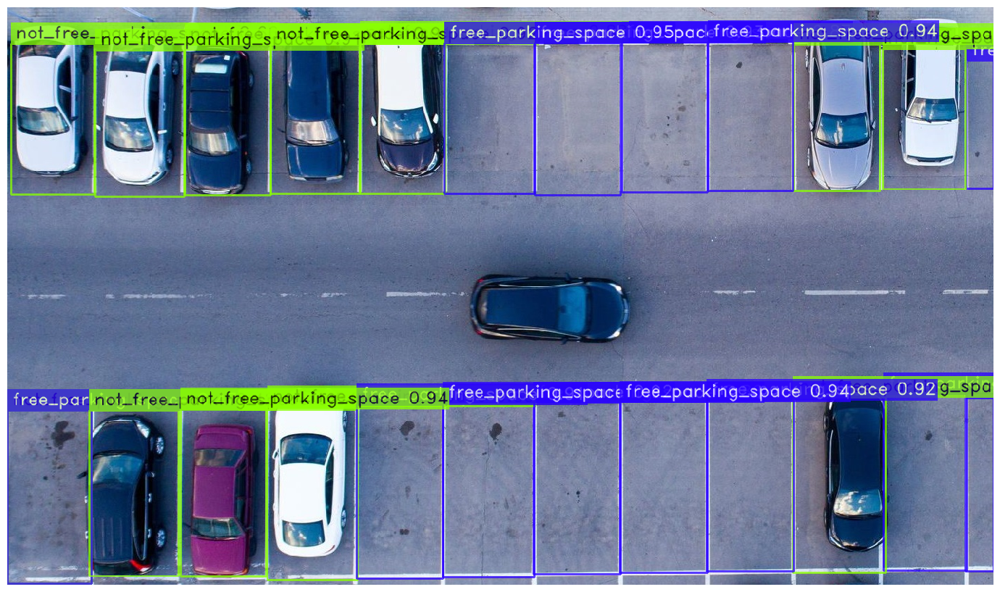

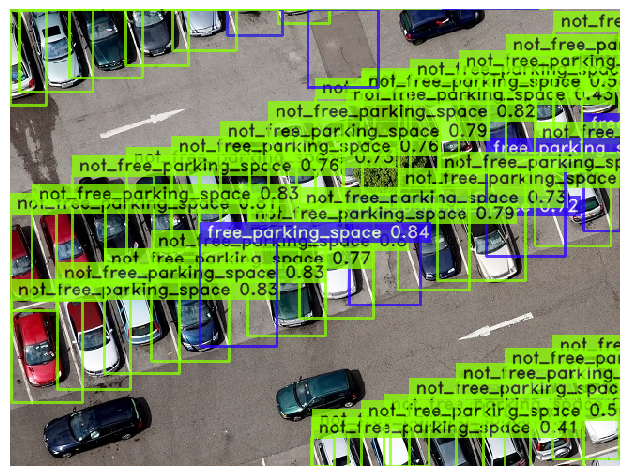

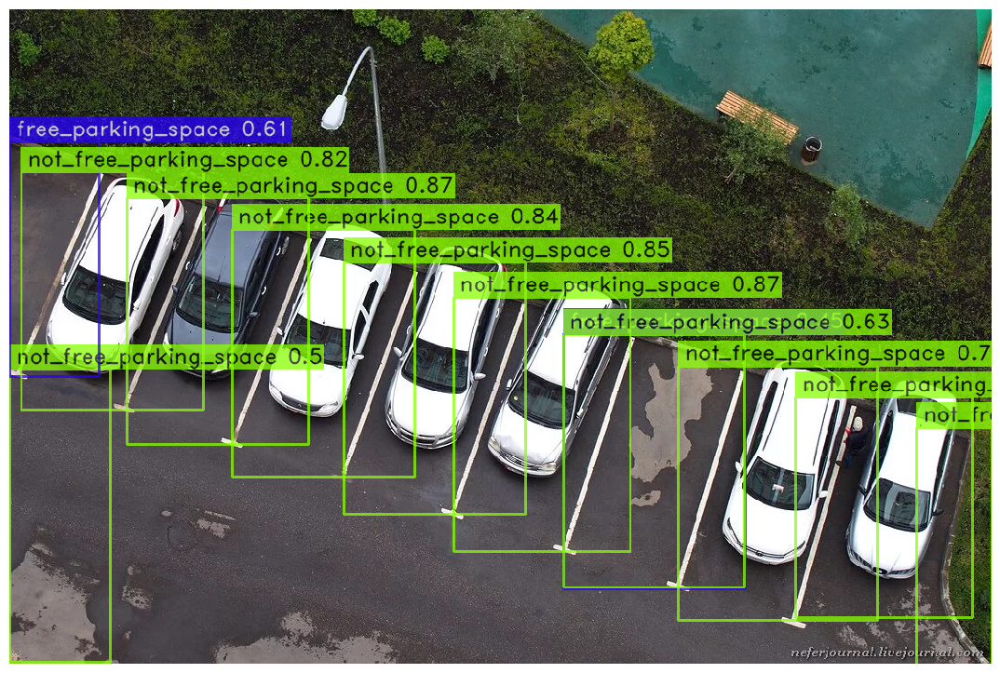

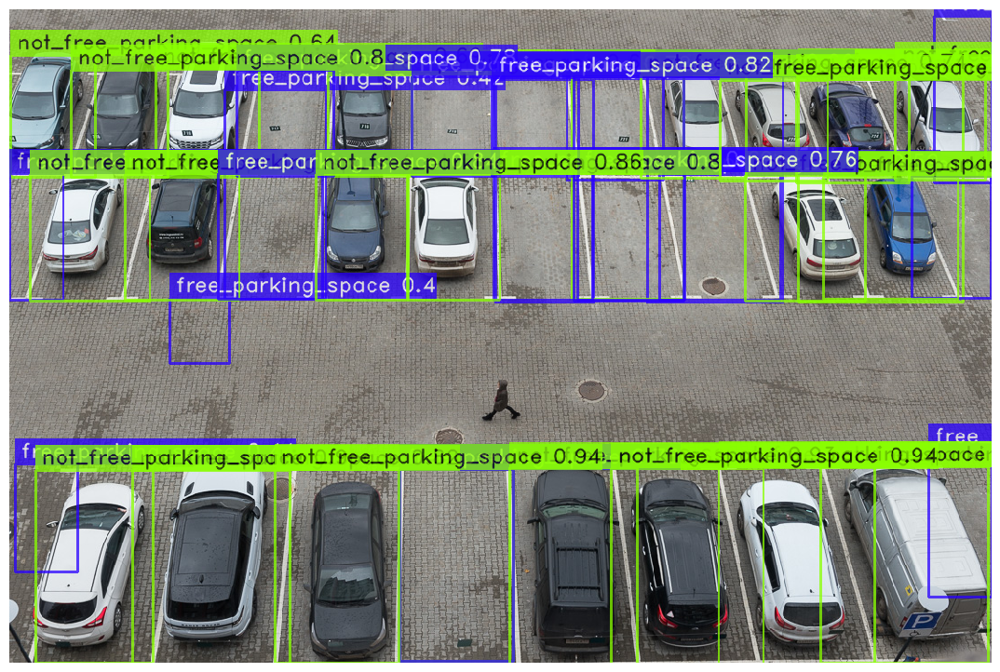

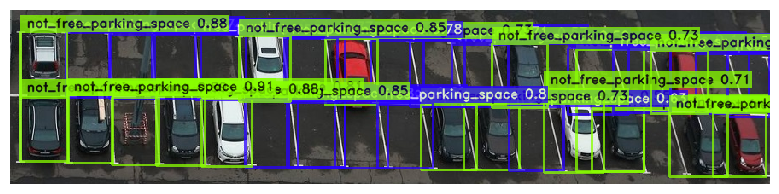

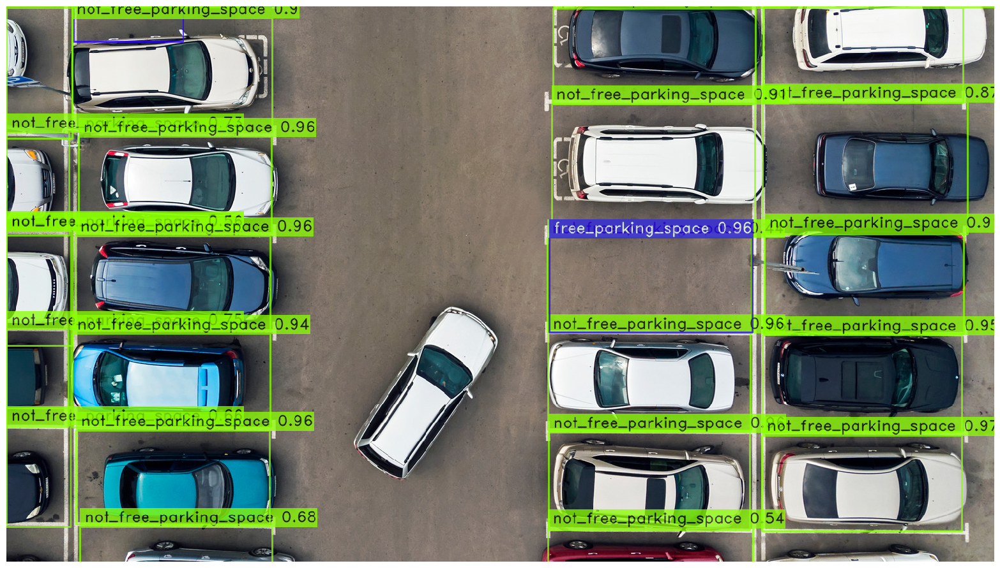

In [13]:
best_model.predict(tpaths, conf=0.4).show()